In [16]:
import torch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from tqdm import tqdm

In [7]:
import torch
import torch.nn as nn
import click
from addict import Dict
import albumentations as A
from torch.utils.data import DataLoader
from albumentations.pytorch.transforms import ToTensorV2
import os

from src.datasets import AnimalsDataset
from src.models import DinoVisionTransformerClassifier
from src.trainers import train_fn
from src.utils import load_yaml

cfg_path = 'src/configs/config.yaml'
cfg = Dict(load_yaml(cfg_path))

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = DinoVisionTransformerClassifier(cfg.model.num_classes, cfg.model.num_features, 
                                        cfg.model.s, cfg.model.m)

model.load_state_dict(torch.load('checkpoints/animal_classification.ckpt')['model_state_dict'])
criterion = nn.CrossEntropyLoss()

transform = A.Compose([
    A.Resize(224, 224),
    A.Normalize(mean=0.5, std=0.5, max_pixel_value=255),
    ToTensorV2()
])
df_train = AnimalsDataset(cfg.df_train.path_to_data, transform, max_samples=cfg.df_train.max_samples_per_class)
df_val = AnimalsDataset(cfg.df_val.path_to_data, transform, max_samples=cfg.df_val.max_samples_per_class)

train_loader = DataLoader(df_train, batch_size=cfg.train_loader.batch_size, 
                          shuffle=cfg.train_loader.shuffle, pin_memory=cfg.train_loader.pin_memory,
                          num_workers=cfg.train_loader.num_workers)

val_loader = DataLoader(df_val, batch_size=cfg.val_loader.batch_size, 
                          shuffle=cfg.val_loader.shuffle, pin_memory=cfg.val_loader.pin_memory,
                          num_workers=cfg.val_loader.num_workers)

dataloaders = {
    'train': train_loader,
    'val': val_loader
}

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 6 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 6 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [46]:
animals_mapping_txt2idx = {'bear': 0,
                 'bird': 1,
                 'gazelle': 2,
                 'goat': 3,
                 'hare': 4,
                 'horse': 5,
                 'marten': 6,
                 'onager': 7,
                 'snow leopard': 8,
                 'wolf': 9}

animals_mapping_idx2txt = {value: key for key, value in animals_mapping_txt2idx.items()}

In [21]:
def inference(model, device, loader, criterion):
    model.to(device)
    model.eval()

    labels_arr = []
    preds_arr = []
    
    epoch_loss, epoch_acc = 0.0, 0.0
    num_elements = 0

    with torch.no_grad():
        for idx, (images, labels) in enumerate(tqdm(loader)):
            images = images.to(device)
            labels = labels.to(device)

            logits = model(images)
            loss = criterion(logits, labels)

            epoch_loss += loss.item()
            epoch_acc += (labels == logits.argmax(dim=1)).sum()
            num_elements += images.shape[0]
            
            labels_arr = labels_arr + labels.tolist() 
            preds_arr = preds_arr + logits.argmax(dim=1).tolist() 
        
    epoch_loss /= num_elements
    epoch_acc /= num_elements

    return epoch_loss, epoch_acc, labels_arr, preds_arr

In [22]:
test_loss, test_acc, labels_arr, preds_arr = inference(model, device, dataloaders['val'], criterion)

  0%|          | 0/961 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:560: UserWarning: This DataLoader will create 6 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
100%|██████████| 961/961 [02:06<00:00,  7.60it/s]


In [24]:
test_acc.item()

0.943649172782898

In [51]:
wrong_indices = np.where(np.array(preds_arr) != np.array(labels_arr))[0]

In [54]:
def denorm(image: torch.tensor):
    return (image * 0.5 + 0.5) 

def plot_images():
    indices = np.random.choice(wrong_indices, size=16)
    fig, ax = plt.subplots(4, 4, figsize=(20, 20))
    for i in range(4):
        for j in range(4):
            ax[i, j].imshow(denorm(df_val[indices[4*i+j]][0]).permute(1, 2, 0))
            ax[i, j].set_title(f'real: {animals_mapping_idx2txt[labels_arr[indices[4*i+j]]]}, predicted: {animals_mapping_idx2txt[preds_arr[indices[4*i+j]]]}')
    plt.show()

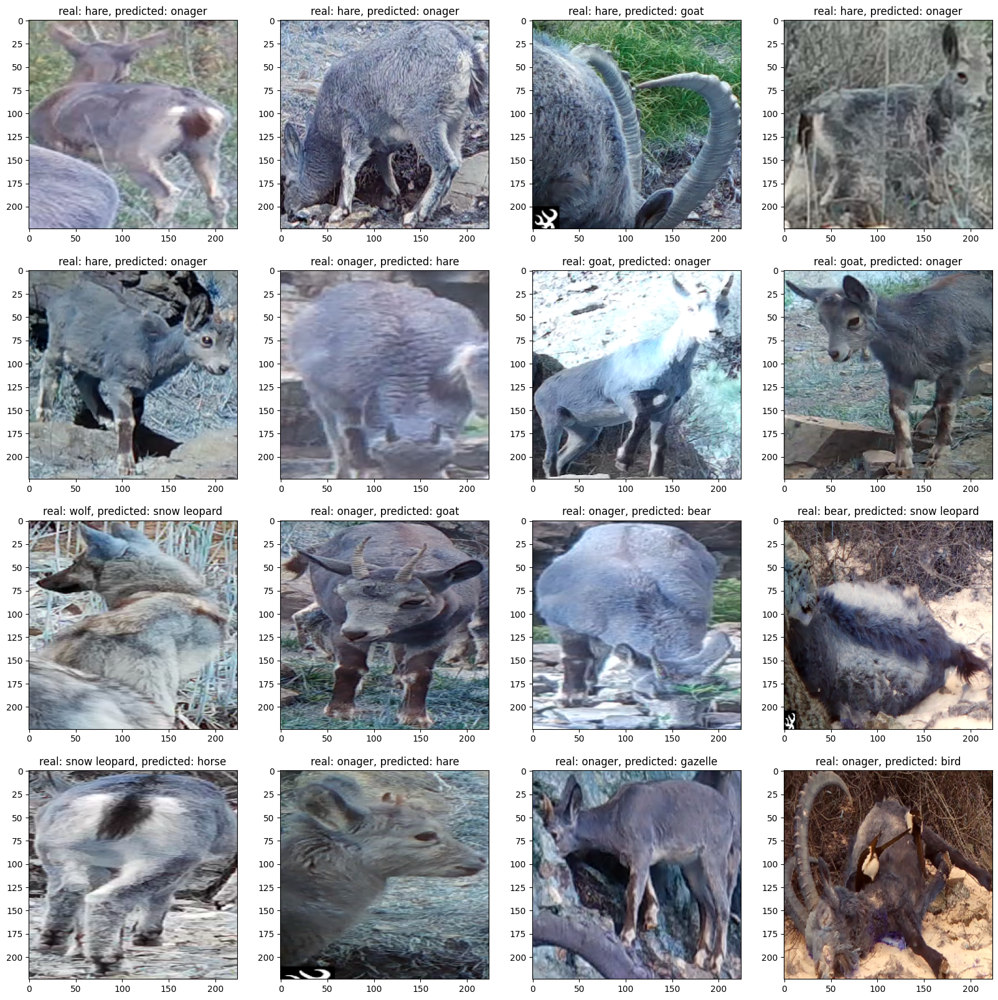

In [55]:
plot_images()

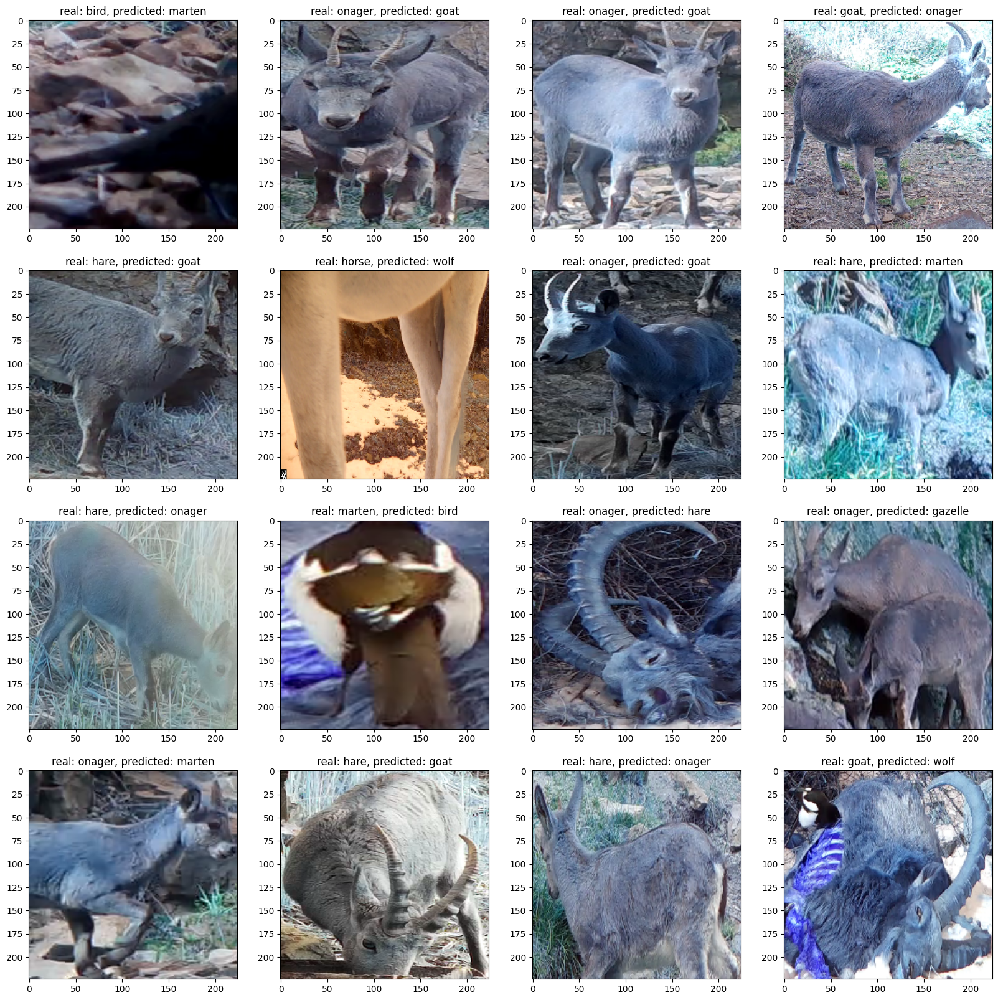

In [56]:
plot_images()

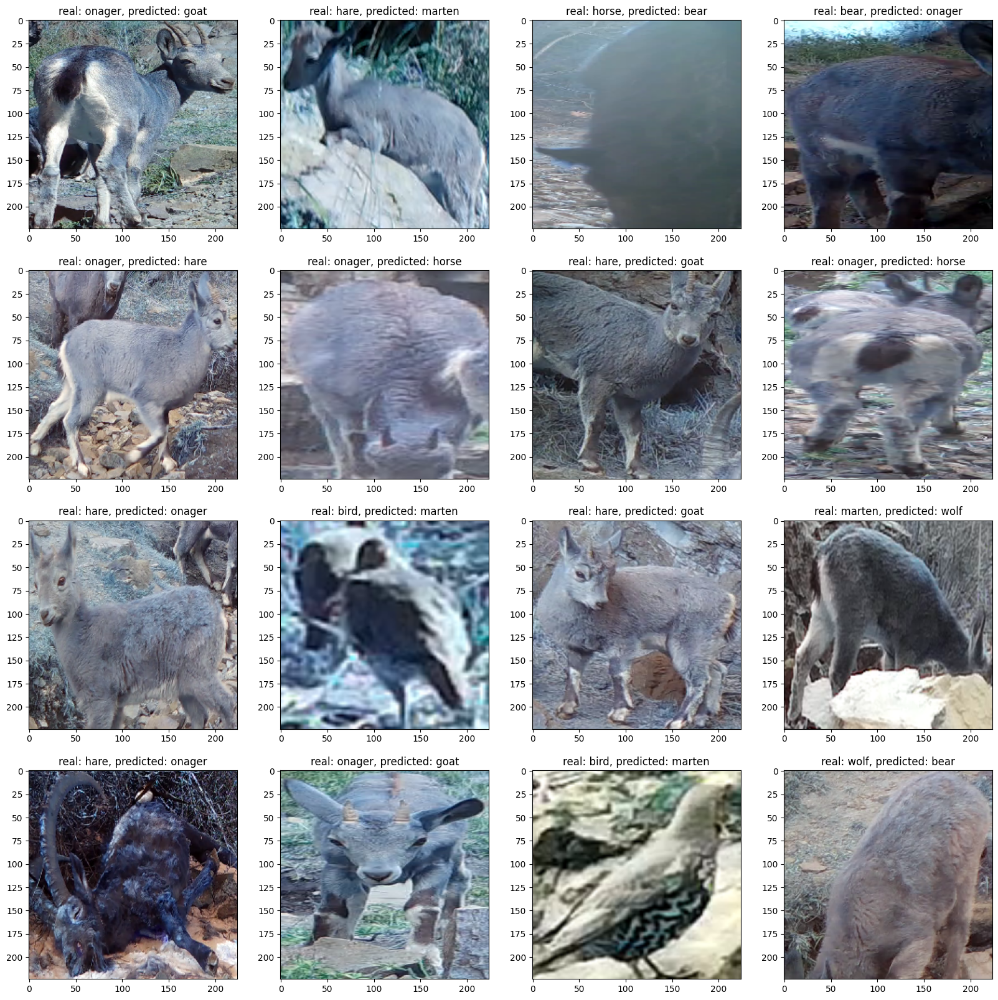

In [57]:
plot_images()

In [73]:
import cv2 

def plot_image(path_to_image: str):
    img = cv2.imread(path_to_image)
    img = transform(image=img)['image']
    
    if img.ndim == 3:
        img = img.unsqueeze(0)
    model.eval()
    model.to(device)
    with torch.no_grad():
        img = img.to(device)
        logits = model(img)
        pred = logits.argmax(dim=1)
    
    plt.imshow(denorm(img.squeeze(0).cpu().permute(1, 2, 0)))
    plt.title(animals_mapping_idx2txt[pred.item()])
    plt.show()

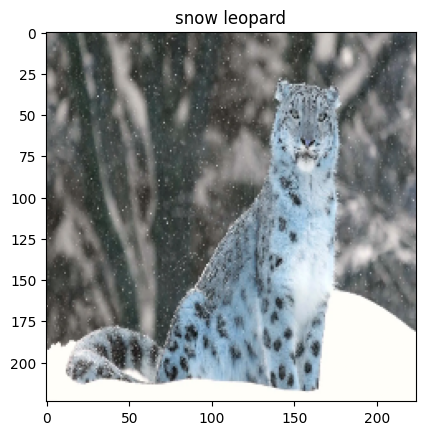

In [74]:
plot_image('sample_images/img.jpeg')

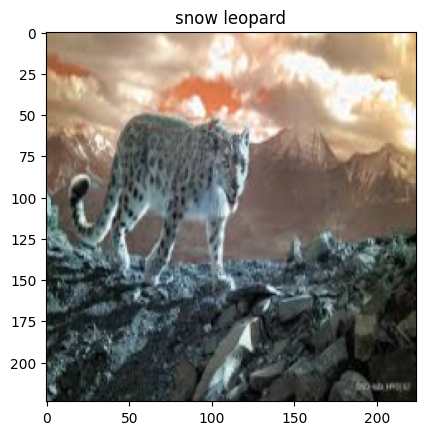

In [75]:
plot_image('sample_images/img2.jpeg')

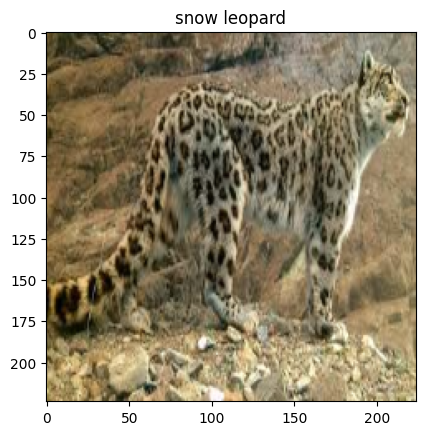

In [76]:
plot_image('sample_images/img3.jpeg')

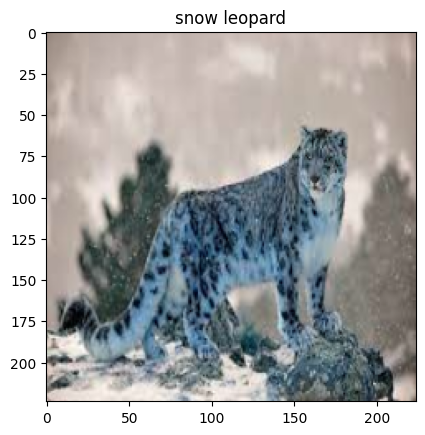

In [77]:
plot_image('sample_images/img4.jpeg')

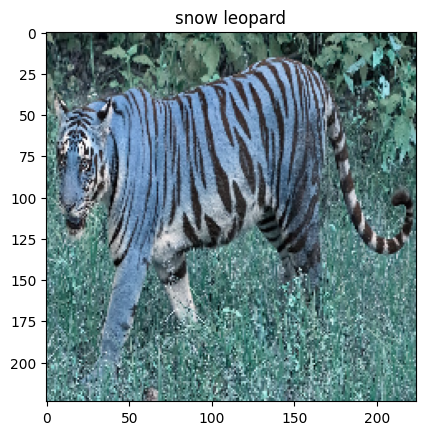

In [78]:
plot_image('sample_images/tiger.jpeg')

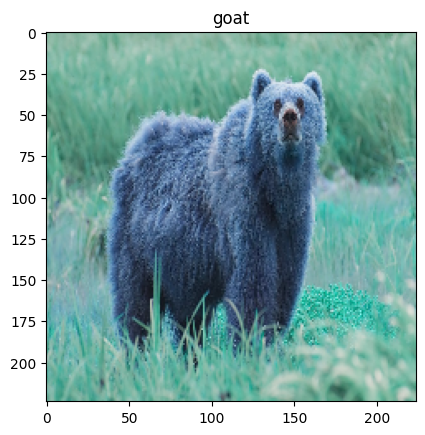

In [79]:
plot_image('sample_images/bear.jpeg')

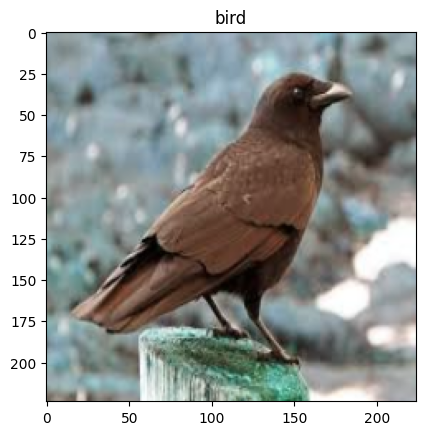

In [80]:
plot_image('sample_images/crow.jpeg')

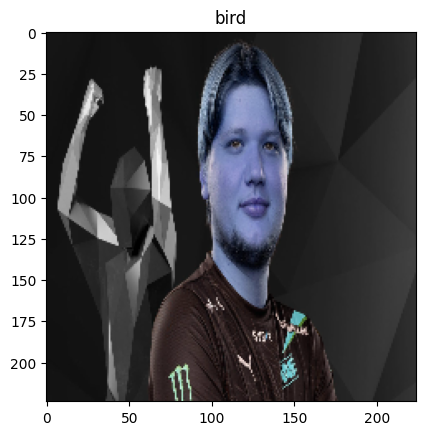

In [81]:
plot_image('sample_images/s1mple.jpeg')